In [1]:
import matplotlib.pyplot as pplt
import plotly.graph_objects as go
import theano.tensor as tt
import scipy.integrate as spi
import scipy as sc
import pymc3 as pm
import math as math
import numpy as np
import pandas as pd
import seaborn as sb
import descartes
import os

from deephaven import *
from deephaven import Plot
from deephaven import QueryScope
from deephaven_jupyter_grid import GridWidget
from deephaven_jupyter_grid import ChartWidget

# Reading Live Data
The first step in building a model is collecting data. Here, we will pull data from the COVID Tracking Project (https://covidtracking.com) that updates daily. We will then trim and store our data accordingly

In [2]:
# making dict of state populations
statePops = {'AK': 731545, 'AL': 4903185, 'AR': 3017804, 'AS': 49437, 'AZ': 7278717,
             'CA': 39512223, 'CO': 5758736, 'CT': 3565287, 'DC': 705749, 'DE': 973764,
             'FL': 21477737, 'GA': 10617423, 'GU': 168485, 'HI': 1415872, 'IA': 3155070,
             'ID': 1787065, 'IL': 12671821, 'IN': 6732219, 'KS': 2913314, 'KY': 4467673,
             'LA': 4648794, 'MA': 6892503, 'MD': 6045680, 'ME': 1344212, 'MI': 9986857,
             'MN': 5639632, 'MO': 6137428, 'MP': 51433, 'MS': 2976149, 'MT': 1068778,
             'NC': 10488084, 'ND': 762062, 'NE': 1934408, 'NH': 1359711, 'NJ': 8882190,
             'NM': 2096829, 'NV': 3080156, 'NY': 19453561, 'OH': 11689100, 'OK': 3956971,
             'OR': 4217737, 'PA': 12801989, 'PR': 3193694, 'RI': 1059361, 'SC': 5148714,
             'SD': 884659, 'TN': 6829174, 'TX': 28995881, 'UT': 3205958, 'VA': 8535519,
             'VI': 106235, 'VT': 623989, 'WA': 7614893, 'WI': 5822434, 'WV': 1792147,
             'WY': 578759}
    
# this function will attempt to fill in missing data from each state as accurately as possible
def fill_na(df):
    df = df.sort_values(by=['date'])
    filled_df = []
    
    # loop through table for each state
    for state in np.unique(df.state):
        # subset by state
        this_df = df.loc[df.state == state,]
        # fill NA forward with first good value
        this_df = this_df.fillna(method='ffill')
        # fill NA backward with zero, this ASSUMES deaths were 0 before first set of reported deaths
        this_df.death = this_df.death.fillna(0)
        # appending filled data to filledDf
        filled_df.append(this_df)

    # concatenating filledDf into dataframe
    filled_df = pd.concat(filled_df)

    return filled_df

# this function will take in a csv and a name and return a dataframe with that name
def load_us_df(file):
    df = pd.read_csv(file)
    df = df[['date','state','positive','negative','recovered','death','hospitalized','total']]
    df = fill_na(df)
    df['date'] = df['date'].apply(lambda d: str(d)[0:4] + '-' + str(d)[4:6] + '-' + str(d)[6:8])
    
    return df

# URL of data
historicalStatesURL = 'https://covidtracking.com/api/v1/states/daily.csv'
# loading data
stateData = load_us_df(historicalStatesURL)
# filtering out territories as data quality is very poor
stateData = stateData[~stateData.state.isin(["AS","DC","GU","MP","PR","VI"])]

# converting data to DH table
stateDataTable = dataFrameToTable(stateData).update("date = convertDateTime(date + `T12:00 NY`)")
# adding table to DH namespace
db.replaceTable("peters_namespace", "covid_data", stateDataTable)

# display DH table
display(GridWidget(db.t("peters_namespace","covid_data")))

GridWidget(api_url='wss://dh-prod-demo.int.illumon.com/socket', auth_token=b'rO0ABXNyABpjb20uZmlzaGxpYi5hdXRoL…

# Bayesian Modelling
Here we define a function that will take in data as well as initial conditions and perform a Markov-Chain Monte Carlo simulation on the given data generation model to estimate the parameters of the SIR model in question.

In [3]:
# here, start is a parameter that will indicate which of 3 sets of starting values to work with
def sampleMCMC(data, pop, start):

    # splitting data into infections and time as numpy arrays
    dataDeath = data['death'].to_numpy()
    time = np.linspace(0,len(data)-1, len(data))

    # establishing model
    with pm.Model() as model:
        
        # create population number priors
        i0 = pm.Poisson('i0', mu=pop/1000)
        s0 = pm.Deterministic('s0', pop - i0)
        
        # extract starting components
        pos = float(data['positive'].iloc[-1])
        rec = float(data['recovered'].iloc[-1])
        dea = float(data['death'].iloc[-1])
        tot = float(data['total'].iloc[-1])
        
        # create starting values based on data, does not inform inference but starts at a reasonable value
        # start beta conditional on start argument
        beta_start = (
            ((pos/tot)/2 if start==1 else
            (pos/tot + pos/pop)/2 if start == 2 else
            (pos/tot)) if (not(math.isnan(pos)) and not(math.isnan(tot))) else .05)
        
        # start gamma conditional on start argument
        gamma_start = (
            ((rec/tot)/2 if start==1 else
            (rec/tot + rec/pop)/2 if start==2 else
            (rec/tot)) if (not(math.isnan(rec)) and not(math.isnan(tot))) else .047)
        
        # start rho conditional on start argument
        rho_start = (
            ((dea/pos)/2 if start==1 else
            (dea/pos + dea/pop)/2 if start==2 else
            (dea/pos)) if (not(math.isnan(dea)) and not(math.isnan(pos))) else .036)
        
        # creating priors for beta, gamma, and rho
        beta = pm.InverseGamma('beta', mu=.05, sigma=.5, testval=beta_start)
        gamma = pm.InverseGamma('gamma', mu=.047, sigma=.5, testval=gamma_start)
        rho = pm.TruncatedNormal('rho', mu=.036, sigma=.01, lower=0, upper=1, testval=rho_start)

        # create number of removed based on analytic solution and above parameters
        sirRem = pm.Deterministic('sirRem',
            pop - ((s0 + i0)**(beta/(beta - gamma)))*
            (s0 + i0*tt.exp(time*(beta - gamma)))**(-gamma/(beta - gamma)))
        # create number of deaths as a fraction of number of removed
        sirDeath = pm.Deterministic('sirDeath', rho*sirRem)
        
        # create variance prior
        sigma = pm.HalfCauchy('sigma', beta=2)
        
        # create likelihood with modelled counts and observed counts
        obsDeath = pm.TruncatedNormal('obsDeath', mu=sirDeath, sigma=sigma,
                                     lower=0, upper=pop, observed=dataDeath)

        # specifying model conditions
        step=pm.NUTS(target_accept=.99)
        start=pm.find_MAP()
        
        # execute sampling
        model_trace = pm.sample(draws=500, tune=500, step=step, start=start, chains=5, cores=16)

    # return posterior samples and other information
    return model_trace

'AK:'

'======================================================================================================='

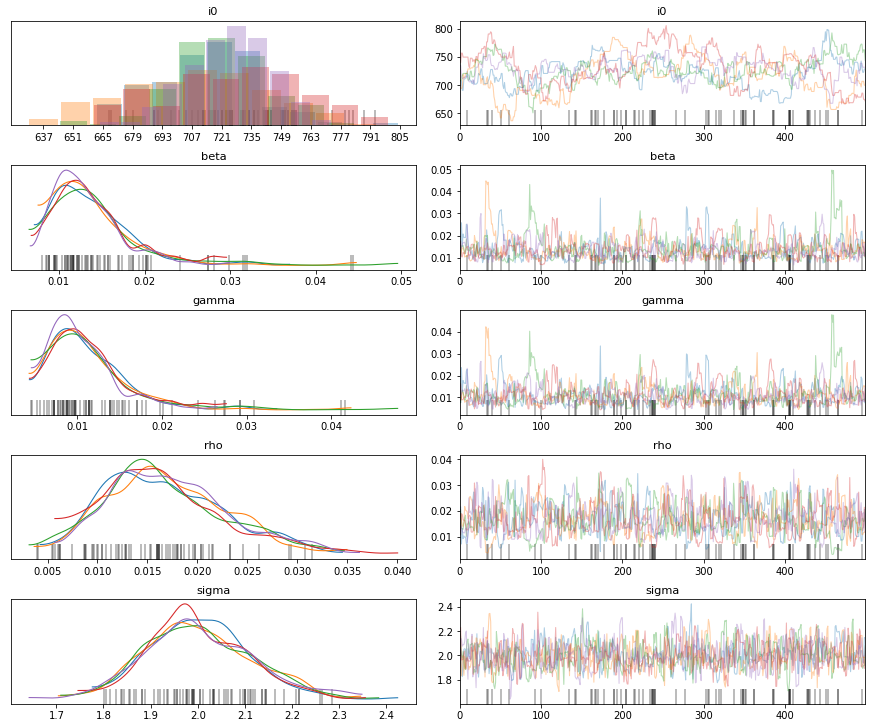

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,724.71040,27.60402,668.00000,773.00000,3.56421,59.98170,1.05777,AK
1,beta,0.01382,0.00490,0.00748,0.02242,0.00025,380.62143,1.00729,AK
2,gamma,0.01119,0.00487,0.00447,0.01964,0.00025,376.47477,1.00807,AK
3,rho,0.01677,0.00604,0.00557,0.02779,0.00027,488.11229,1.00762,AK
4,sigma,2.00142,0.10937,1.80553,2.21308,0.00349,981.55703,1.00530,AK


'AK succeeded'

'======================================================================================================='

'AL:'

'======================================================================================================='

'AL failed'

'======================================================================================================='

'AR:'

'======================================================================================================='

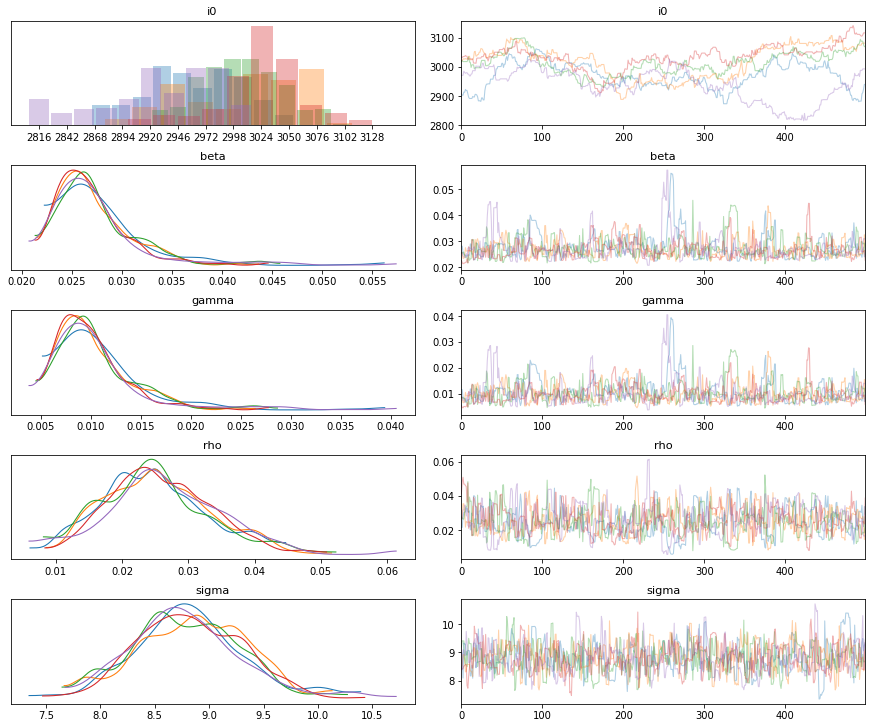

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,2994.53080,58.64696,2884.00000,3095.00000,16.76537,12.23671,1.35436,AR
1,beta,0.02735,0.00423,0.02192,0.03484,0.00025,279.09082,1.00607,AR
2,gamma,0.01046,0.00420,0.00498,0.01786,0.00025,279.65760,1.00590,AR
3,rho,0.02538,0.00809,0.01110,0.04135,0.00043,361.39961,1.00588,AR
4,sigma,8.81223,0.50360,7.85852,9.69516,0.01910,694.87367,1.00254,AR


'AR succeeded'

'======================================================================================================='

'AZ:'

'======================================================================================================='

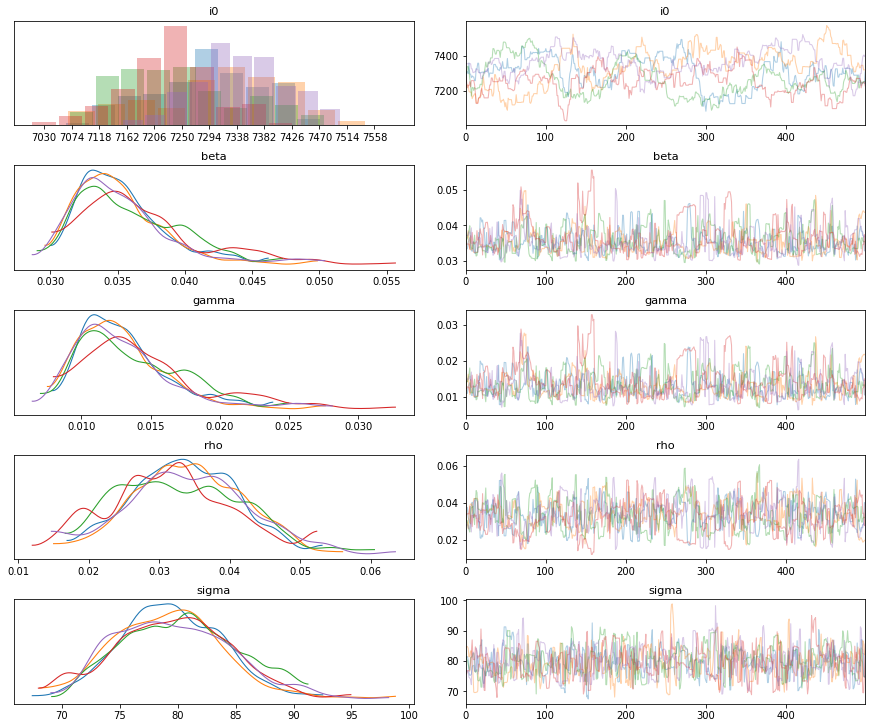

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,7303.89760,96.14056,7124.00000,7464.00000,23.18935,17.18843,1.24235,AZ
1,beta,0.03572,0.00392,0.02992,0.04338,0.00021,341.48925,1.01218,AZ
2,gamma,0.01354,0.00388,0.00776,0.02121,0.00021,341.70307,1.01208,AZ
3,rho,0.03322,0.00833,0.01772,0.04828,0.00040,427.76374,1.00888,AZ
4,sigma,79.63197,4.78130,71.01884,88.88533,0.18318,681.30466,1.00575,AZ


'AZ succeeded'

'======================================================================================================='

'CA:'

'======================================================================================================='

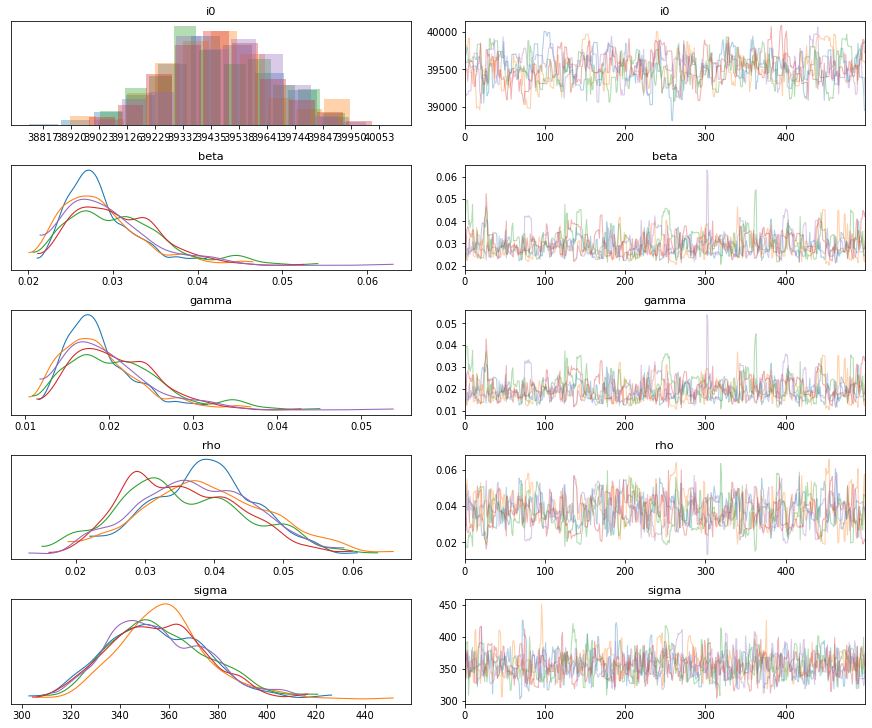

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,39515.43640,195.49069,39174.00000,39904.00000,11.01026,315.25144,1.00507,CA
1,beta,0.02950,0.00510,0.02170,0.03897,0.00024,446.86794,1.01880,CA
2,gamma,0.01981,0.00510,0.01173,0.02901,0.00024,446.39661,1.01968,CA
3,rho,0.03707,0.00861,0.02167,0.05322,0.00039,478.39656,1.01853,CA
4,sigma,356.12477,19.89897,319.63963,391.54931,0.69772,813.38020,1.00925,CA


'CA succeeded'

'======================================================================================================='

'CO:'

'======================================================================================================='

'CO failed'

'======================================================================================================='

'CT:'

'======================================================================================================='

'CT failed'

'======================================================================================================='

'DE:'

'======================================================================================================='

'DE failed'

'======================================================================================================='

'FL:'

'======================================================================================================='

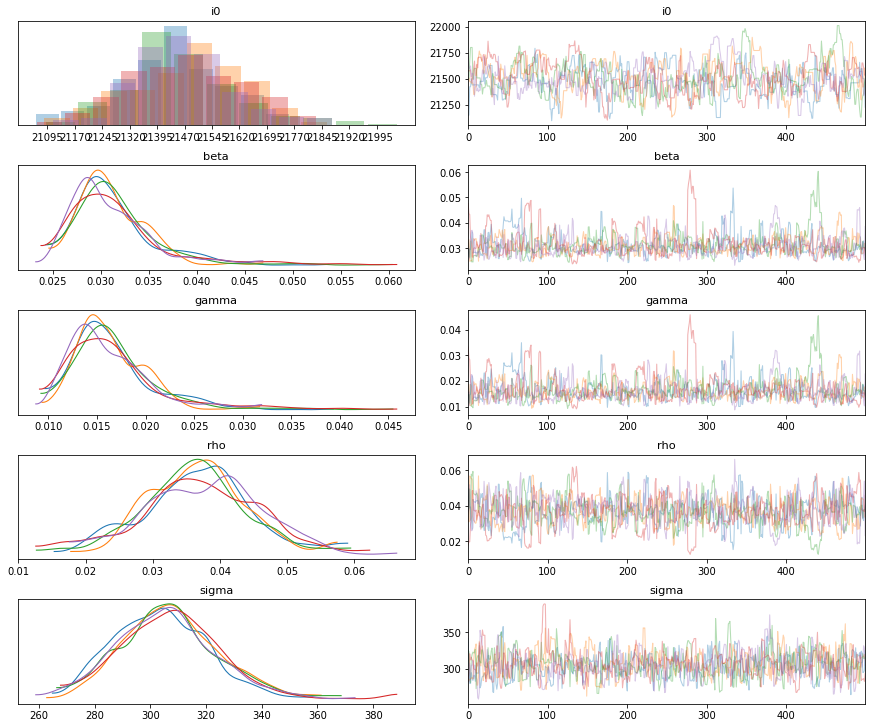

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,21502.41480,148.37449,21221.00000,21771.00000,10.61617,195.33614,1.02235,FL
1,beta,0.03132,0.00445,0.02458,0.03929,0.00025,328.74063,1.00807,FL
2,gamma,0.01657,0.00446,0.01001,0.02453,0.00024,335.32928,1.00793,FL
3,rho,0.03676,0.00814,0.02085,0.05261,0.00038,449.93265,1.00849,FL
4,sigma,306.07158,17.45851,274.09626,338.84743,0.69077,638.78152,1.00606,FL


'FL succeeded'

'======================================================================================================='

'GA:'

'======================================================================================================='

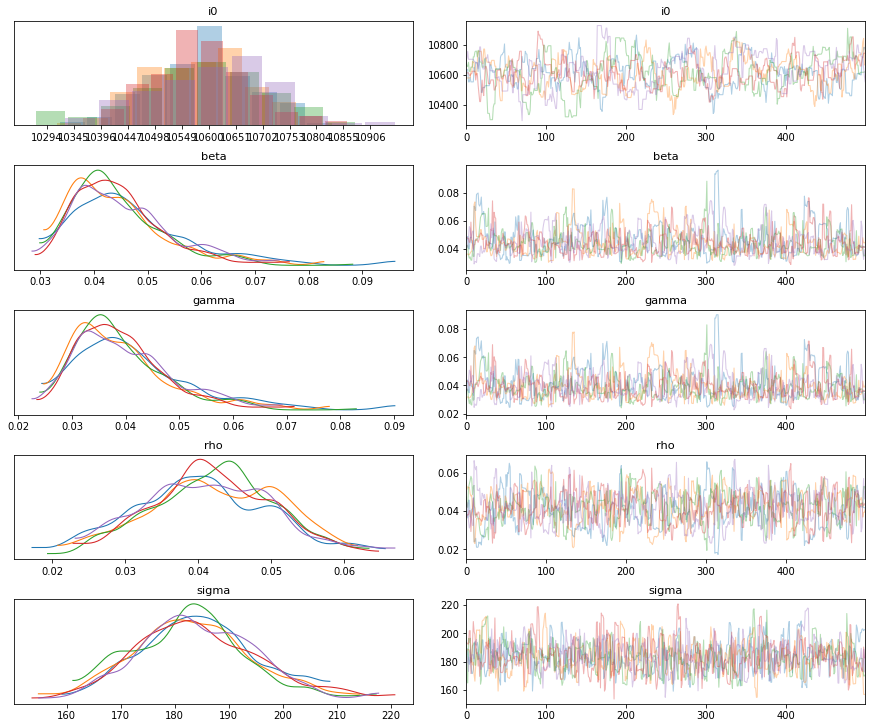

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,10615.83680,105.26089,10416.00000,10797.00000,7.92465,176.43069,1.02748,GA
1,beta,0.04507,0.00944,0.03053,0.06358,0.00048,389.52605,1.00673,GA
2,gamma,0.03974,0.00947,0.02436,0.05755,0.00048,387.98792,1.00700,GA
3,rho,0.04163,0.00872,0.02511,0.05767,0.00042,434.65743,1.00618,GA
4,sigma,183.75344,10.73660,163.76227,203.85182,0.41873,657.44314,1.00661,GA


'GA succeeded'

'======================================================================================================='

'HI:'

'======================================================================================================='

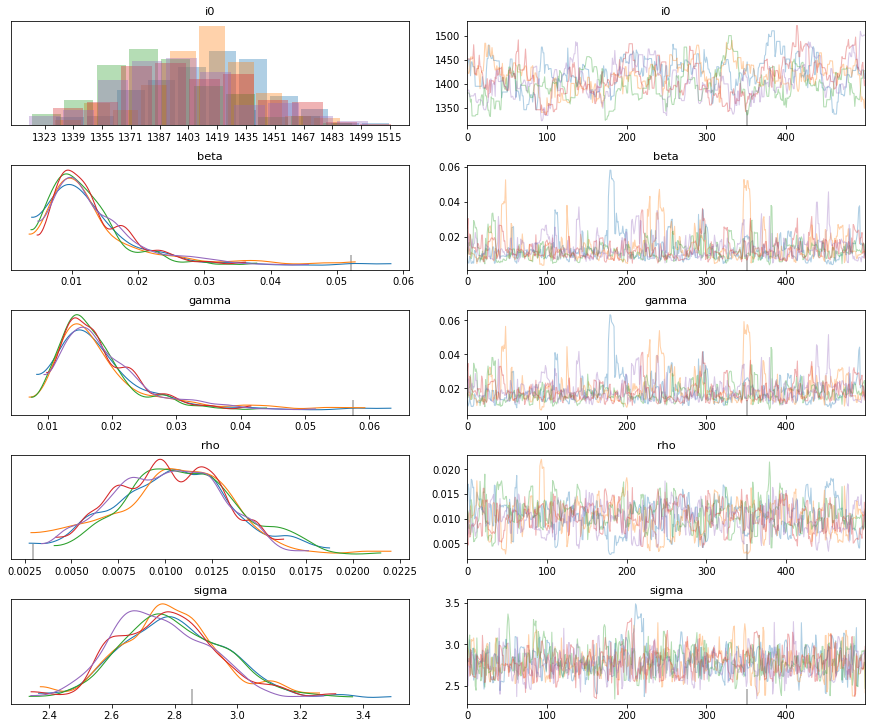

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,1411.30480,34.87150,1340.00000,1473.00000,3.98591,76.53959,1.05833,HI
1,beta,0.01319,0.00705,0.00461,0.02607,0.00038,350.16924,1.00632,HI
2,gamma,0.01839,0.00714,0.00919,0.03158,0.00038,350.60122,1.00668,HI
3,rho,0.01035,0.00303,0.00430,0.01562,0.00016,367.04400,1.00901,HI
4,sigma,2.78429,0.16643,2.48892,3.10902,0.00606,754.97643,1.00758,HI


'HI succeeded'

'======================================================================================================='

'IA:'

'======================================================================================================='

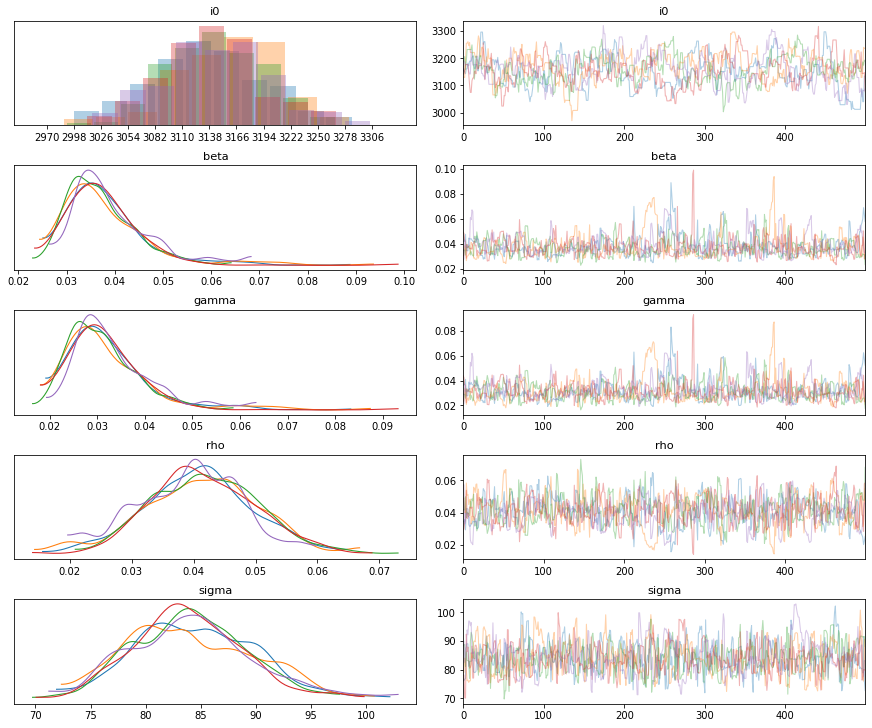

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,3157.88520,54.10591,3058.00000,3263.00000,4.46372,146.92514,1.01809,IA
1,beta,0.03802,0.00830,0.02500,0.05145,0.00045,346.91669,1.01008,IA
2,gamma,0.03199,0.00837,0.01913,0.04585,0.00045,350.22673,1.01025,IA
3,rho,0.04087,0.00880,0.02539,0.05854,0.00042,444.59424,1.00943,IA
4,sigma,84.08168,5.36146,74.75890,94.15794,0.21120,644.43106,1.00969,IA


'IA succeeded'

'======================================================================================================='

'ID:'

'======================================================================================================='

'ID failed'

'======================================================================================================='

'IL:'

'======================================================================================================='

'IL failed'

'======================================================================================================='

'IN:'

'======================================================================================================='

'IN failed'

'======================================================================================================='

'KS:'

'======================================================================================================='

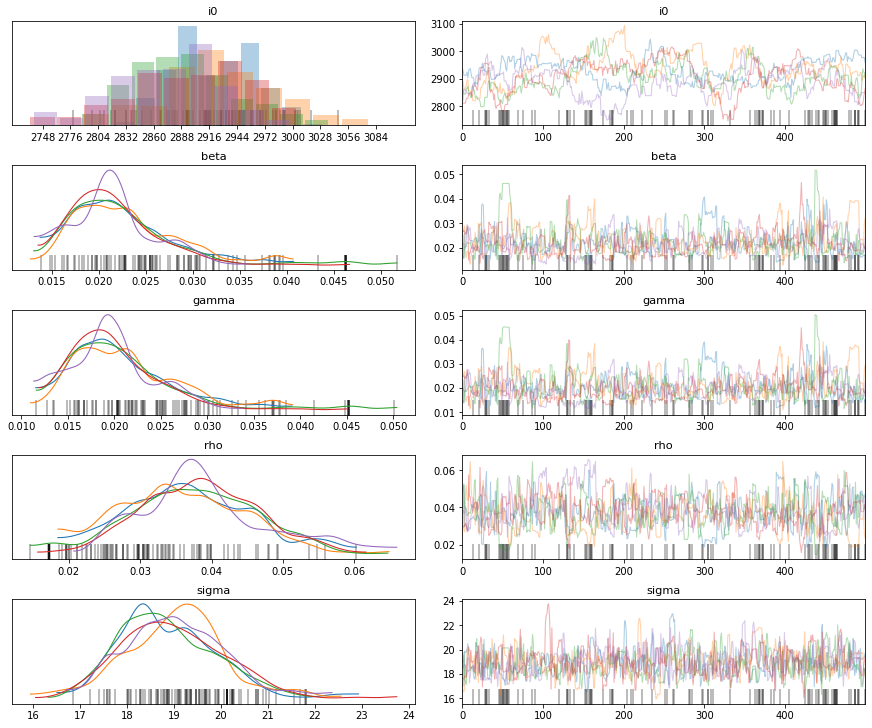

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,2912.70040,55.84882,2806.00000,3012.00000,7.87913,50.24259,1.07903,KS
1,beta,0.02219,0.00541,0.01359,0.03138,0.00030,329.35041,1.01980,KS
2,gamma,0.02048,0.00543,0.01194,0.02962,0.00029,338.99939,1.01876,KS
3,rho,0.03752,0.00886,0.02218,0.05588,0.00052,294.05013,1.02457,KS
4,sigma,18.95699,1.07931,17.07610,20.99955,0.04429,593.79498,1.01081,KS


'KS succeeded'

'======================================================================================================='

'KY:'

'======================================================================================================='

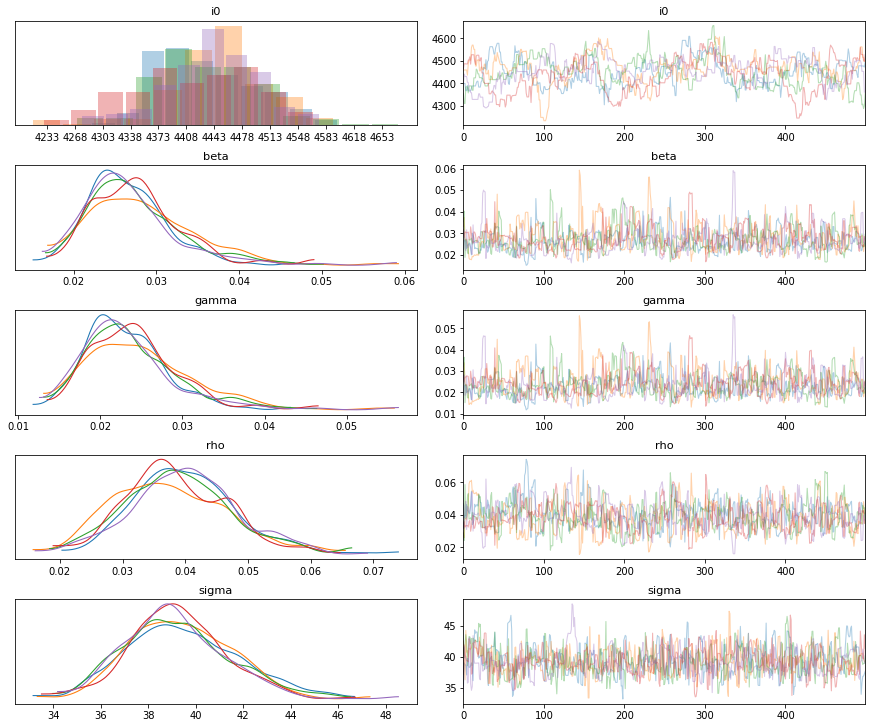

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,4449.68360,64.12364,4326.00000,4567.00000,6.48426,97.79488,1.04459,KY
1,beta,0.02727,0.00575,0.01767,0.03772,0.00026,485.19897,1.01105,KY
2,gamma,0.02381,0.00577,0.01447,0.03459,0.00026,491.02499,1.01074,KY
3,rho,0.03894,0.00857,0.02258,0.05503,0.00039,494.10120,1.01230,KY
4,sigma,39.27026,2.17930,35.34394,43.32778,0.08267,694.87832,1.00799,KY


'KY succeeded'

'======================================================================================================='

'LA:'

'======================================================================================================='

'LA failed'

'======================================================================================================='

'MA:'

'======================================================================================================='

'MA failed'

'======================================================================================================='

'MD:'

'======================================================================================================='

'MD failed'

'======================================================================================================='

'ME:'

'======================================================================================================='

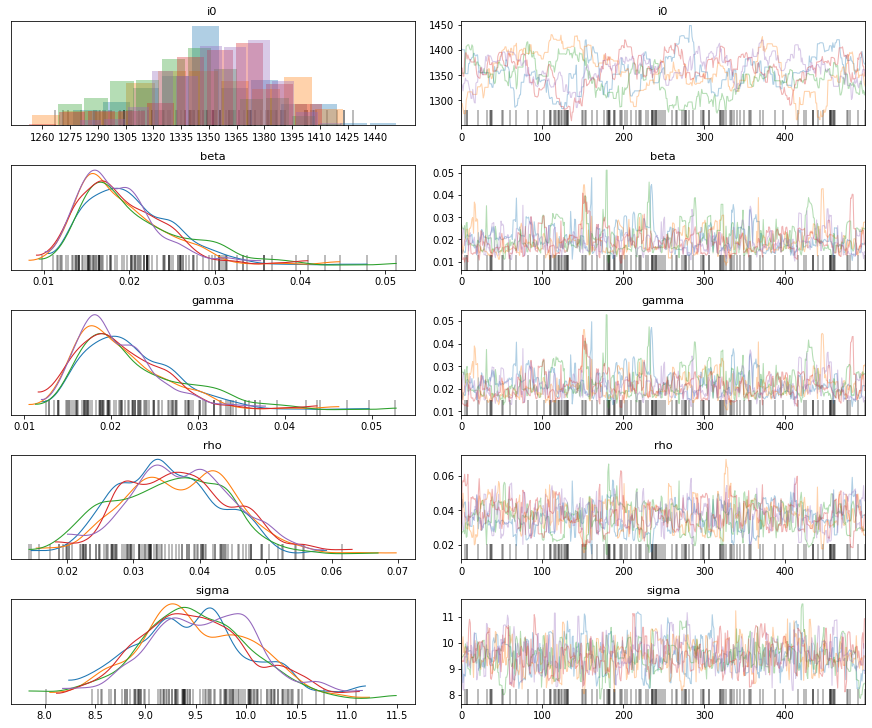

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,1355.96040,32.66080,1288.00000,1410.00000,4.85988,45.16513,1.10125,ME
1,beta,0.01969,0.00556,0.01163,0.03058,0.00031,325.55904,1.02174,ME
2,gamma,0.02166,0.00558,0.01294,0.03190,0.00031,329.89935,1.02187,ME
3,rho,0.03638,0.00825,0.02114,0.05064,0.00042,394.69346,1.01556,ME
4,sigma,9.50224,0.58176,8.42261,10.61414,0.02439,568.72215,1.00582,ME


'ME succeeded'

'======================================================================================================='

'MI:'

'======================================================================================================='

'MI failed'

'======================================================================================================='

'MN:'

'======================================================================================================='

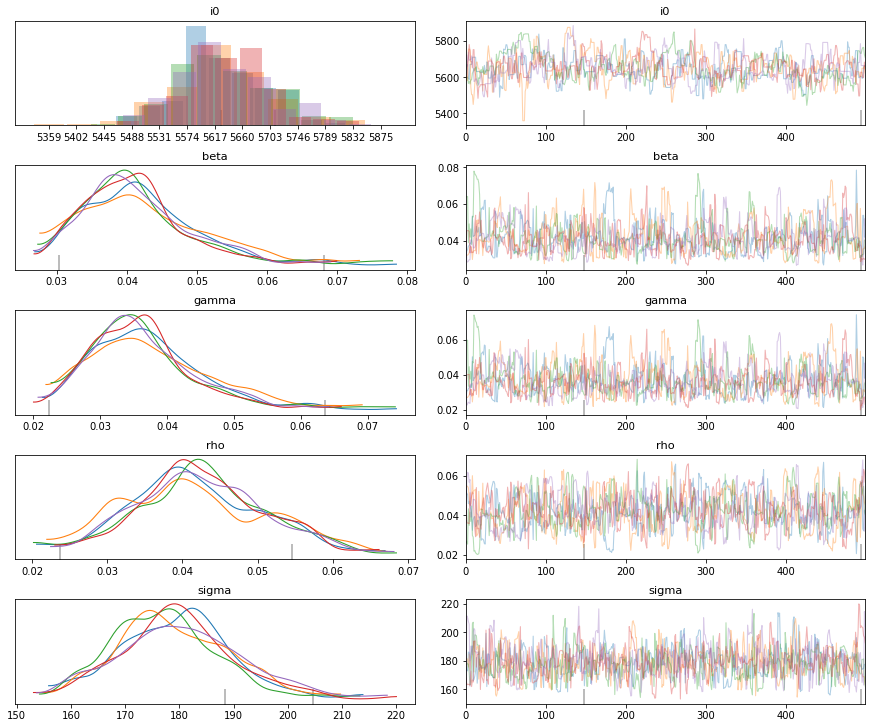

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,5650.52120,71.08856,5517.00000,5785.00000,4.55987,243.04936,1.01288,MN
1,beta,0.04175,0.00834,0.02890,0.05776,0.00041,415.20969,1.00574,MN
2,gamma,0.03680,0.00843,0.02316,0.05268,0.00041,422.21136,1.00625,MN
3,rho,0.04208,0.00876,0.02651,0.05893,0.00042,435.46646,1.00542,MN
4,sigma,179.04052,10.57500,159.36882,198.52707,0.39545,715.12774,1.00704,MN


'MN succeeded'

'======================================================================================================='

'MO:'

'======================================================================================================='

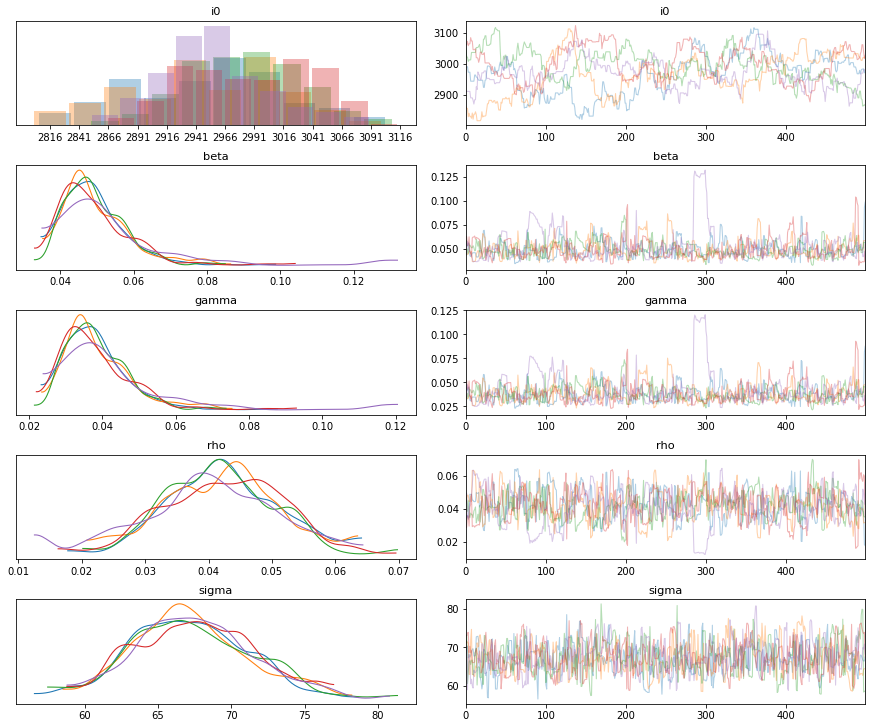

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,2978.19920,58.80811,2868.00000,3084.00000,13.00994,20.43261,1.19543,MS
1,beta,0.05030,0.01138,0.03544,0.06845,0.00078,212.18202,1.01410,MS
2,gamma,0.03921,0.01137,0.02395,0.05723,0.00078,212.24825,1.01415,MS
3,rho,0.04166,0.00922,0.02390,0.05863,0.00051,327.51533,1.01761,MS
4,sigma,67.30949,3.98280,59.97370,74.88780,0.16637,573.07727,1.00506,MS


'MS succeeded'

'======================================================================================================='

'MT:'

'======================================================================================================='

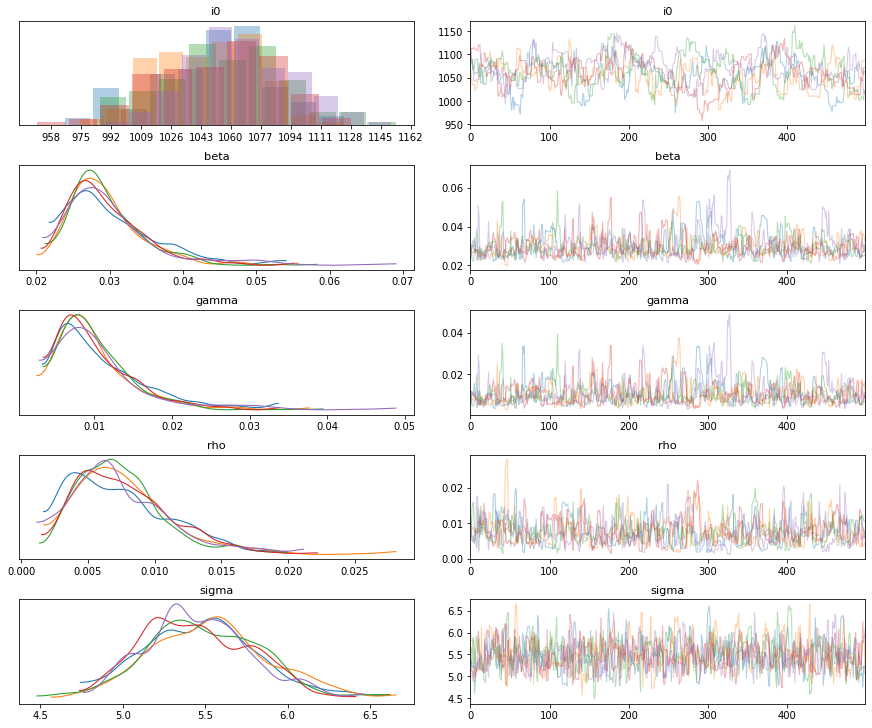

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,1061.22280,32.26137,1000.00000,1120.00000,2.90996,122.91081,1.05394,MT
1,beta,0.02980,0.00578,0.02191,0.04060,0.00031,349.34809,1.01517,MT
2,gamma,0.01041,0.00554,0.00326,0.02036,0.00030,351.40503,1.01338,MT
3,rho,0.00754,0.00363,0.00163,0.01409,0.00017,443.54393,1.00863,MT
4,sigma,5.48287,0.34388,4.87538,6.13501,0.01259,745.82988,1.00550,MT


'MT succeeded'

'======================================================================================================='

'NC:'

'======================================================================================================='

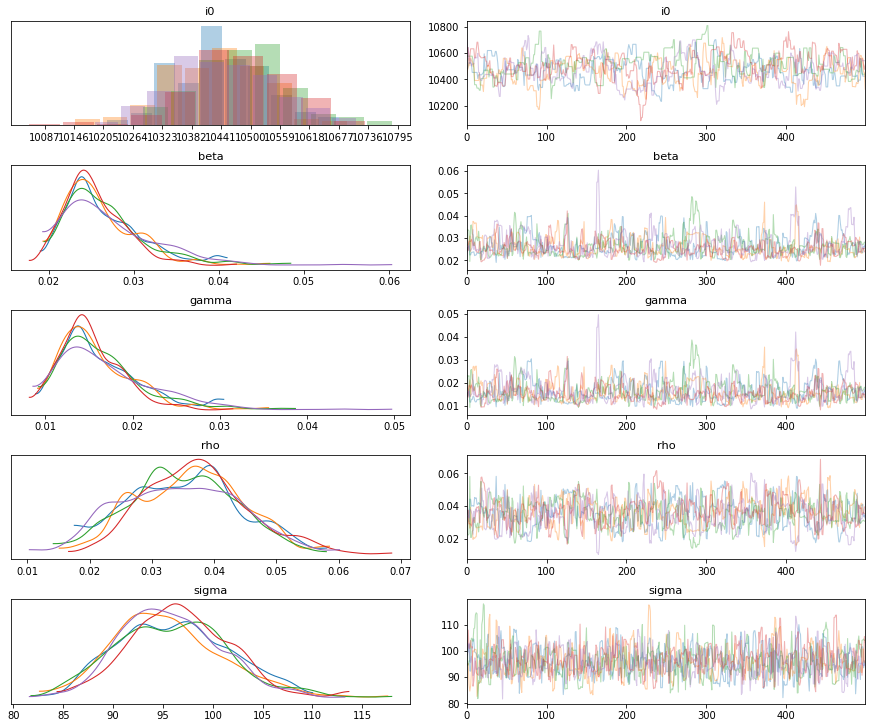

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,10481.99160,100.08662,10308.00000,10666.00000,7.82565,163.57270,1.05026,NC
1,beta,0.02641,0.00468,0.01991,0.03552,0.00023,409.79125,1.01259,NC
2,gamma,0.01621,0.00469,0.00946,0.02514,0.00023,412.80297,1.01284,NC
3,rho,0.03554,0.00878,0.01948,0.05166,0.00042,433.90696,1.01258,NC
4,sigma,96.07841,5.53356,85.43143,106.01276,0.18121,932.54113,1.00900,NC


'NC succeeded'

'======================================================================================================='

'ND:'

'======================================================================================================='

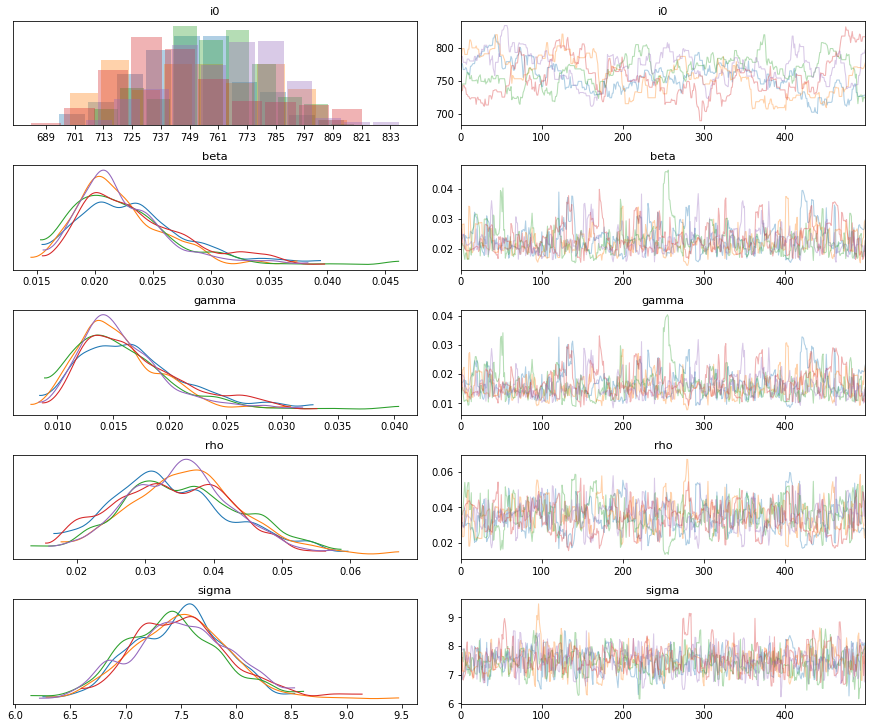

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,760.38560,25.86854,712.00000,805.00000,4.13997,39.04358,1.10216,ND
1,beta,0.02285,0.00449,0.01569,0.03107,0.00025,318.41742,1.00942,ND
2,gamma,0.01625,0.00449,0.00916,0.02464,0.00025,322.26732,1.00918,ND
3,rho,0.03474,0.00846,0.01785,0.04890,0.00043,386.30911,1.00620,ND
4,sigma,7.48059,0.43689,6.65929,8.23654,0.01514,832.46723,1.00824,ND


'ND succeeded'

'======================================================================================================='

'NE:'

'======================================================================================================='

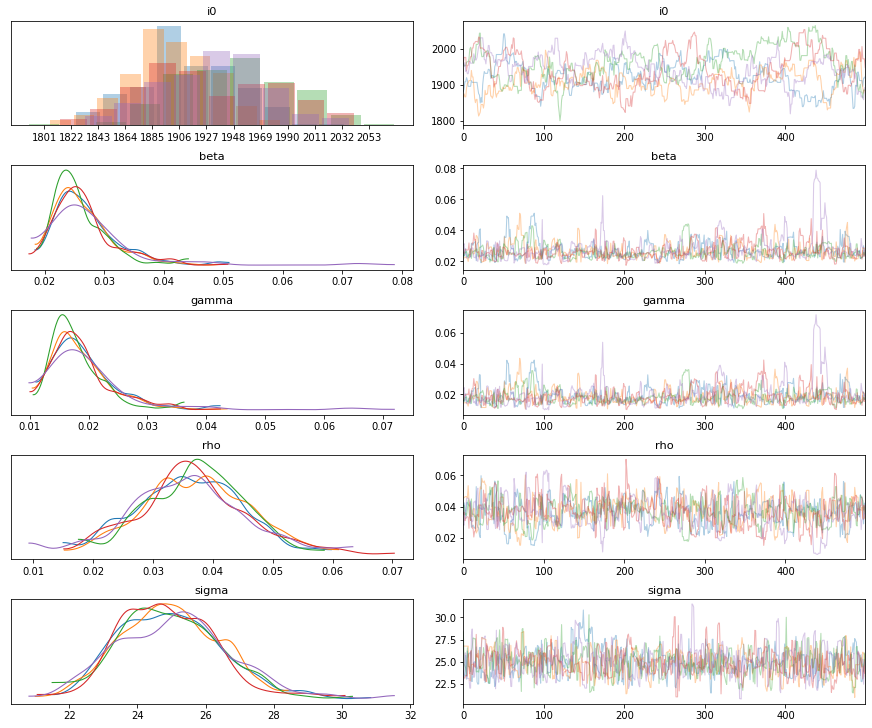

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,1934.91520,45.40583,1851.00000,2019.00000,9.53856,22.65990,1.16426,NE
1,beta,0.02681,0.00598,0.01891,0.03704,0.00035,288.54032,1.02097,NE
2,gamma,0.01898,0.00603,0.01098,0.02906,0.00036,286.90182,1.02225,NE
3,rho,0.03644,0.00886,0.01936,0.05240,0.00043,434.10801,1.01866,NE
4,sigma,24.94885,1.51161,22.28574,27.79127,0.05774,685.41410,1.00723,NE


'NE succeeded'

'======================================================================================================='

'NH:'

'======================================================================================================='

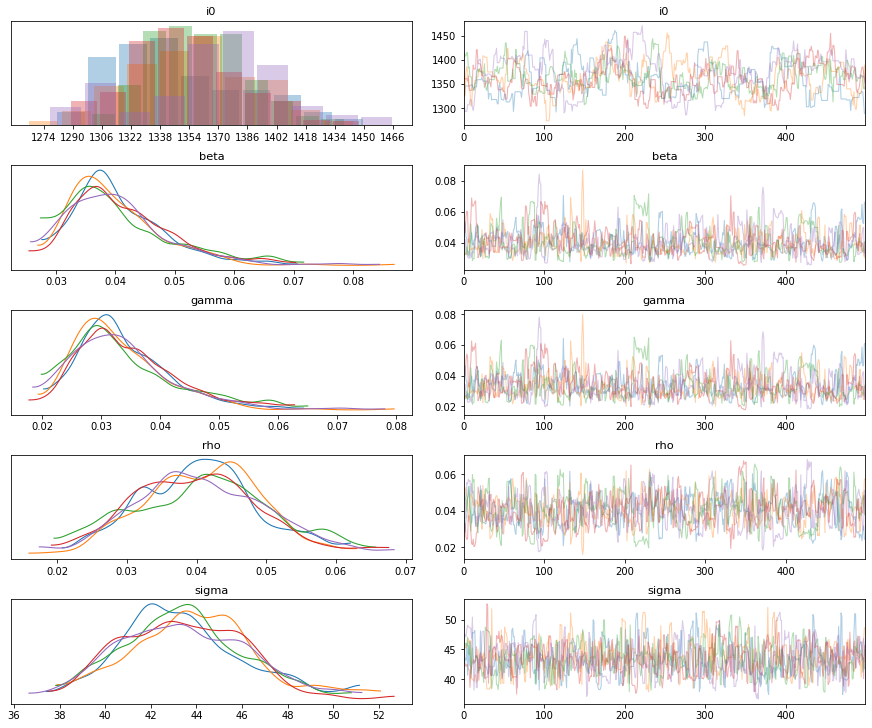

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,1364.36960,33.76968,1302.00000,1423.00000,3.06301,121.55085,1.04480,NH
1,beta,0.04051,0.00846,0.02737,0.05680,0.00041,432.64675,1.01144,NH
2,gamma,0.03375,0.00854,0.02043,0.05050,0.00041,440.04930,1.01130,NH
3,rho,0.04057,0.00903,0.02404,0.05786,0.00040,507.02215,1.01019,NH
4,sigma,43.50111,2.71030,38.29163,48.26903,0.10036,729.33617,1.00476,NH


'NH succeeded'

'======================================================================================================='

'NJ:'

'======================================================================================================='

'NJ failed'

'======================================================================================================='

'NM:'

'======================================================================================================='

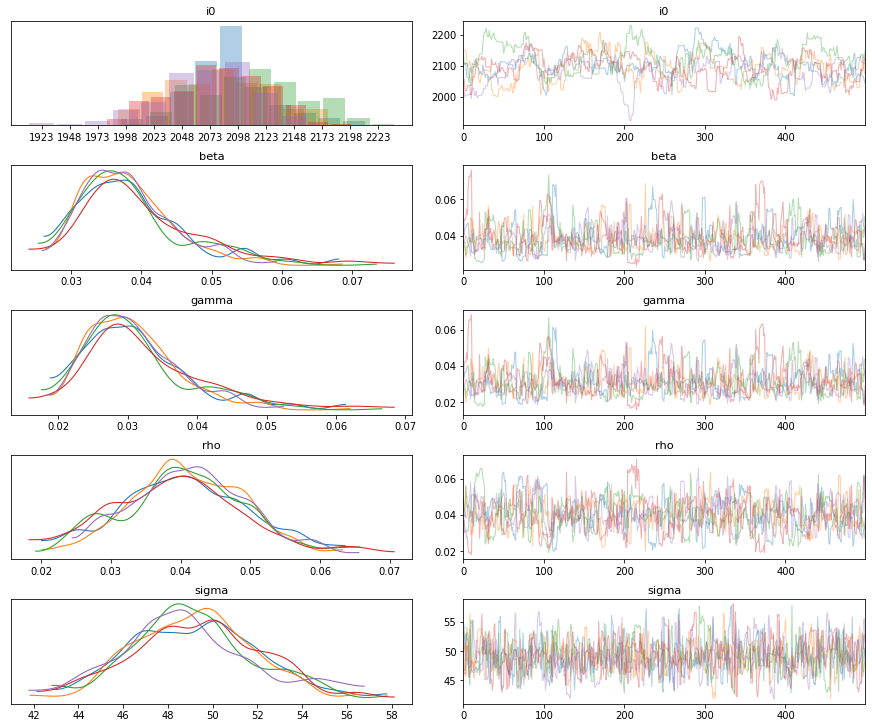

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,2097.75480,44.55801,2004.00000,2172.00000,5.82702,58.47346,1.07621,NM
1,beta,0.03863,0.00756,0.02790,0.05503,0.00038,395.43404,1.00408,NM
2,gamma,0.03129,0.00760,0.01890,0.04611,0.00038,397.71681,1.00454,NM
3,rho,0.04055,0.00873,0.02413,0.05664,0.00043,413.75335,1.00423,NM
4,sigma,49.13384,2.82121,44.11640,54.71561,0.09252,929.81393,1.00618,NM


'NM succeeded'

'======================================================================================================='

'NV:'

'======================================================================================================='

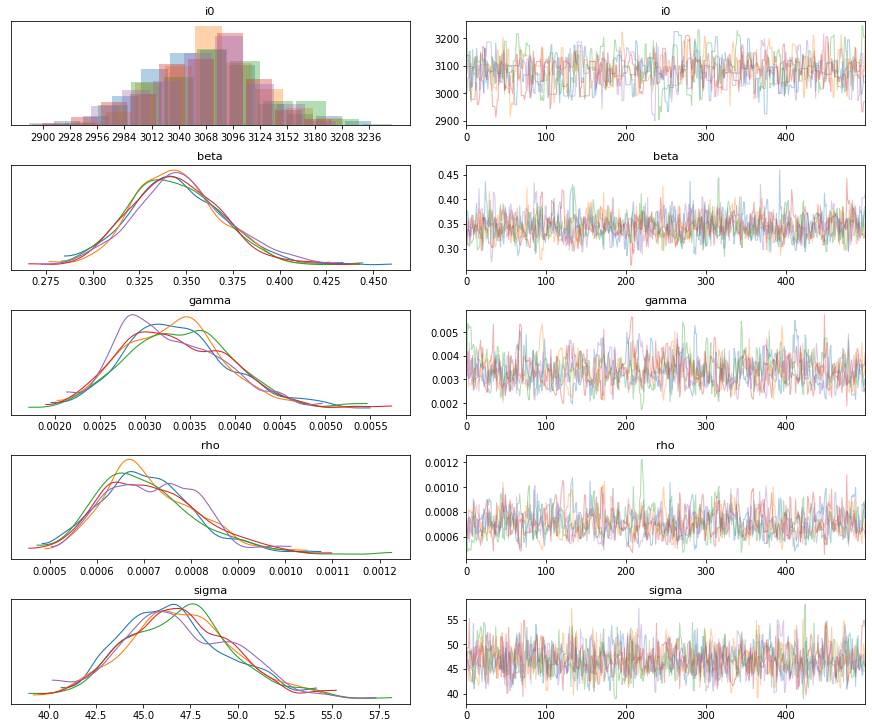

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,3083.48120,55.40268,2975.00000,3187.00000,2.30986,575.29337,1.00806,NV
1,beta,0.34530,0.02477,0.30102,0.39266,0.00081,926.29315,1.00474,NV
2,gamma,0.00335,0.00061,0.00224,0.00448,0.00002,610.45042,1.00352,NV
3,rho,0.00071,0.00011,0.00053,0.00092,0.00000,646.10107,1.00310,NV
4,sigma,46.84337,2.92403,41.15877,52.06413,0.08525,1176.35918,1.00264,NV


'NV succeeded'

'======================================================================================================='

'NY:'

'======================================================================================================='

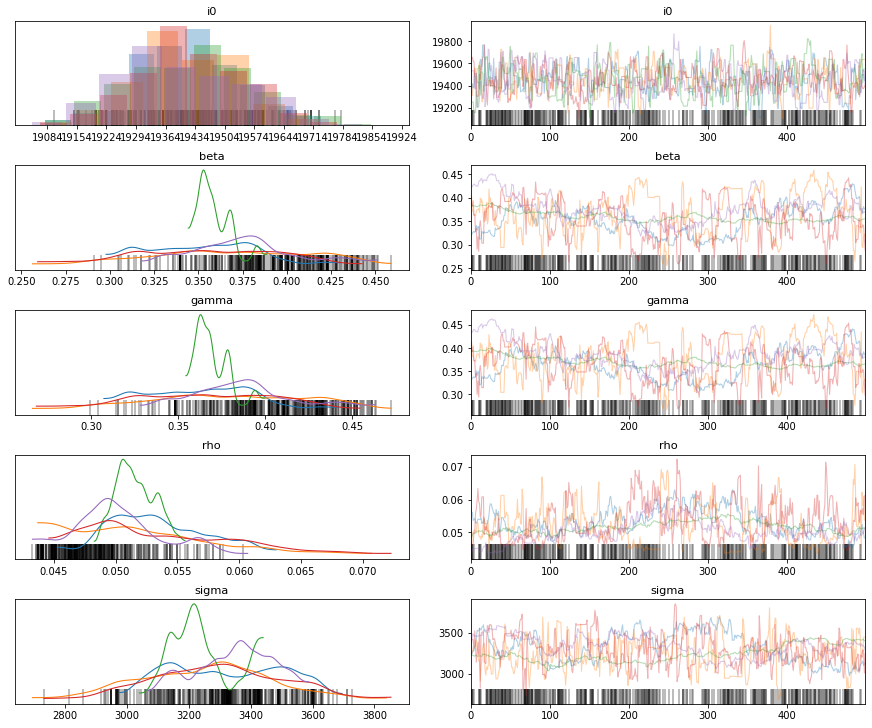

'NY failed'

'======================================================================================================='

'OH:'

'======================================================================================================='

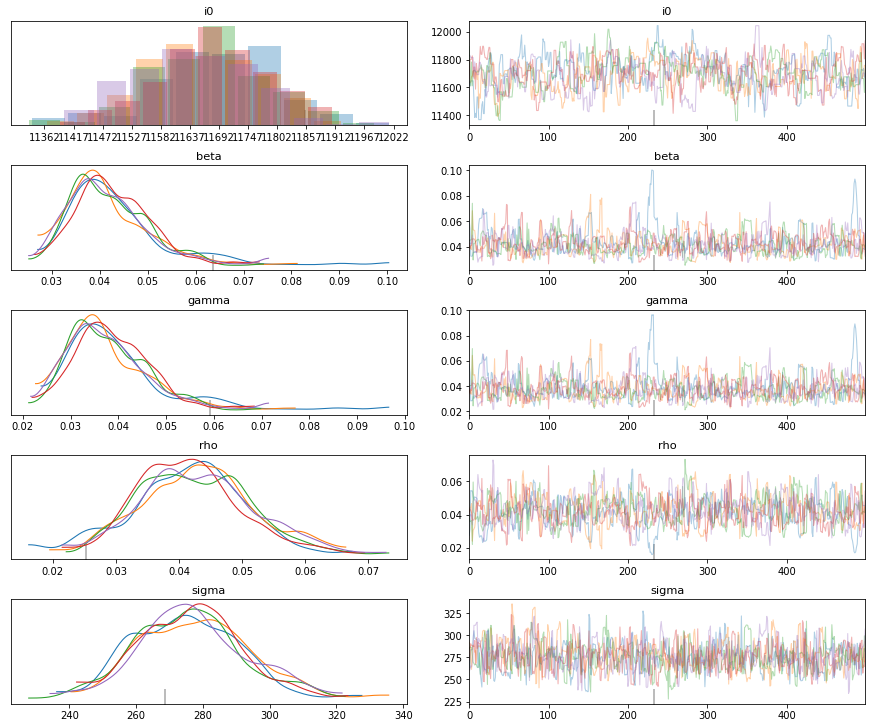

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,11697.48080,110.98941,11461.00000,11872.00000,7.15805,240.42164,1.01380,OH
1,beta,0.04227,0.00889,0.02799,0.05866,0.00042,439.87627,1.00564,OH
2,gamma,0.03813,0.00893,0.02371,0.05456,0.00042,443.34794,1.00540,OH
3,rho,0.04214,0.00870,0.02661,0.05939,0.00039,498.32146,1.00670,OH
4,sigma,276.31558,15.90832,247.91362,307.40612,0.61428,670.67502,1.00859,OH


'OH succeeded'

'======================================================================================================='

'OK:'

'======================================================================================================='

'OK failed'

'======================================================================================================='

'OR:'

'======================================================================================================='

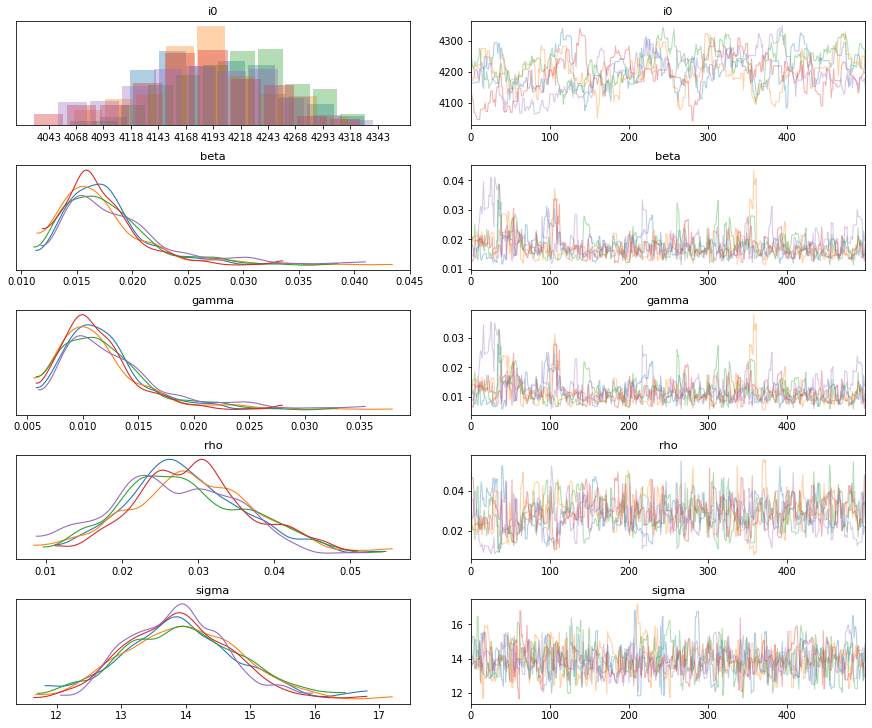

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,4205.01520,56.69578,4106.00000,4323.00000,8.09762,49.02154,1.08244,OR
1,beta,0.01778,0.00429,0.01159,0.02564,0.00029,218.19616,1.01421,OR
2,gamma,0.01204,0.00431,0.00575,0.01969,0.00029,219.32507,1.01191,OR
3,rho,0.02834,0.00815,0.01363,0.04392,0.00045,334.37044,1.01119,OR
4,sigma,13.90995,0.85714,12.33185,15.53294,0.03265,689.03280,1.01564,OR


'OR succeeded'

'======================================================================================================='

'PA:'

'======================================================================================================='

'PA failed'

'======================================================================================================='

'RI:'

'======================================================================================================='

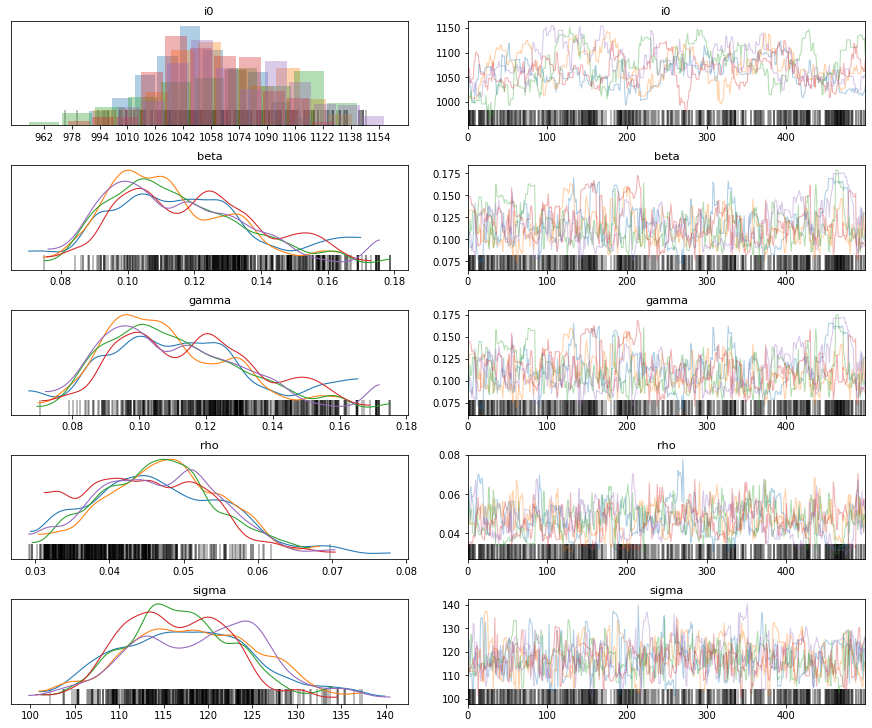

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,1069.23760,33.91748,1012.00000,1136.00000,4.29588,62.33657,1.06229,RI
1,beta,0.11587,0.02098,0.08275,0.15919,0.00188,125.00242,1.02031,RI
2,gamma,0.11175,0.02106,0.07777,0.15503,0.00188,125.52826,1.02036,RI
3,rho,0.04643,0.00816,0.03133,0.05975,0.00058,200.75623,1.01828,RI
4,sigma,117.61934,6.95217,104.06930,129.62812,0.32257,464.50318,1.01664,RI


'RI succeeded'

'======================================================================================================='

'SC:'

'======================================================================================================='

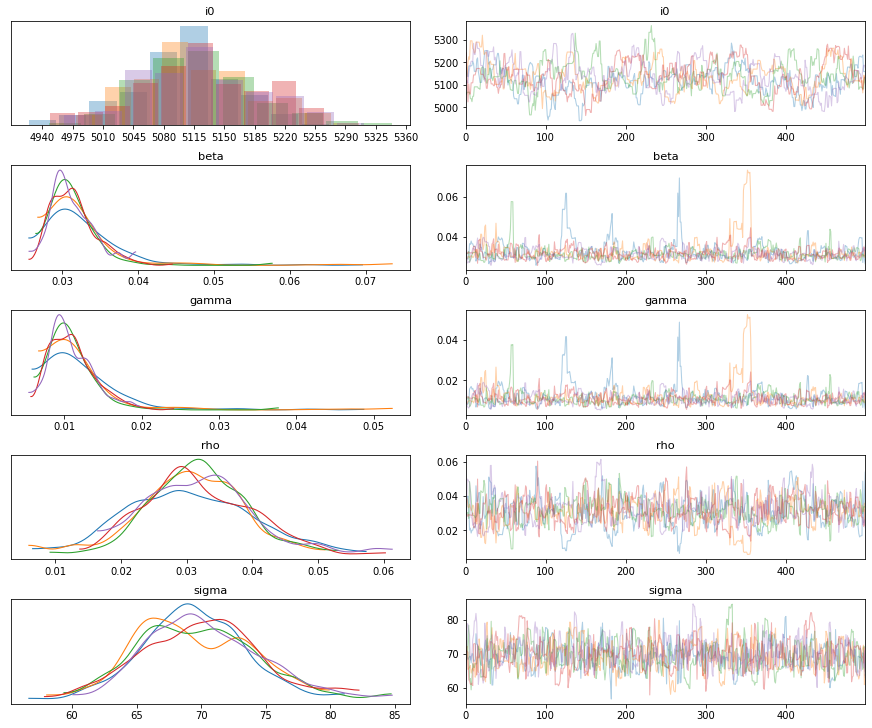

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,5133.76880,65.97451,5006.00000,5253.00000,5.66052,135.84395,1.02155,SC
1,beta,0.03189,0.00437,0.02664,0.03807,0.00028,247.89420,1.01516,SC
2,gamma,0.01139,0.00434,0.00629,0.01763,0.00027,249.60321,1.01603,SC
3,rho,0.03120,0.00824,0.01577,0.04657,0.00040,414.98901,1.01534,SC
4,sigma,69.71451,4.31684,61.98160,77.93021,0.18031,573.18295,1.00499,SC


'SC succeeded'

'======================================================================================================='

'SD:'

'======================================================================================================='

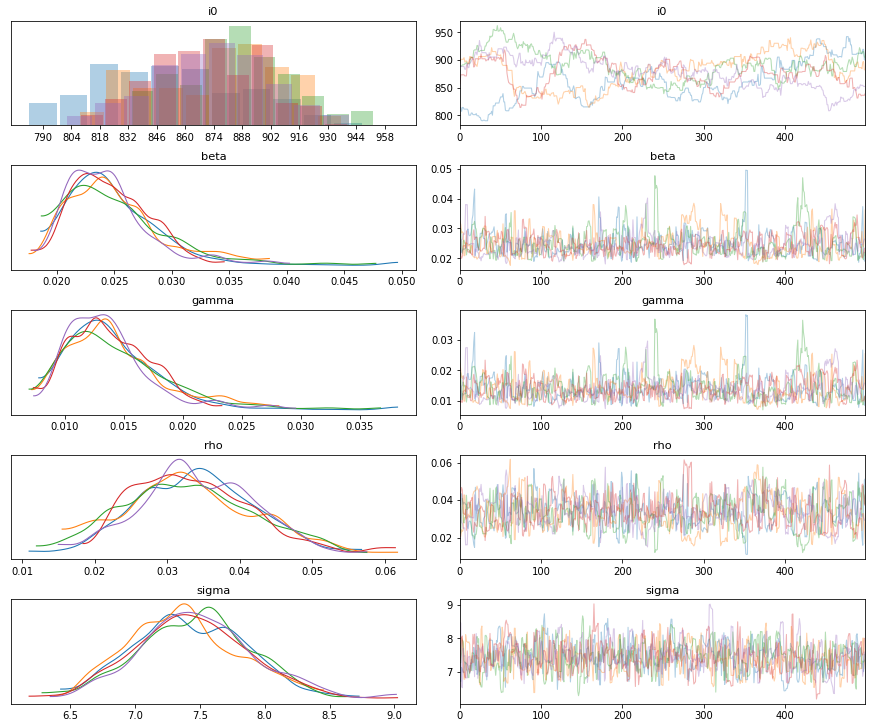

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,877.15760,31.21499,817.00000,930.00000,8.07934,14.92708,1.25422,SD
1,beta,0.02482,0.00405,0.01857,0.03225,0.00022,329.22572,1.00903,SD
2,gamma,0.01404,0.00404,0.00811,0.02181,0.00022,332.80900,1.00985,SD
3,rho,0.03352,0.00842,0.01783,0.04884,0.00041,427.73556,1.00811,SD
4,sigma,7.43356,0.43492,6.65957,8.24516,0.01644,700.26186,1.01250,SD


'SD succeeded'

'======================================================================================================='

'TN:'

'======================================================================================================='

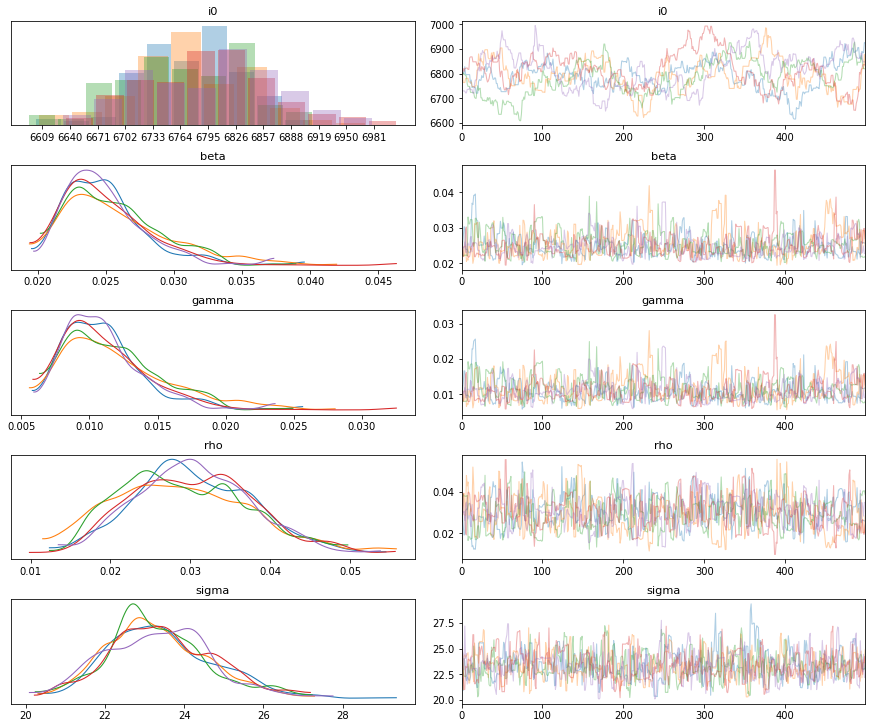

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,6798.26760,68.08673,6673.00000,6921.00000,8.98872,57.37585,1.06666,TN
1,beta,0.02523,0.00338,0.01995,0.03142,0.00018,352.53912,1.01646,TN
2,gamma,0.01135,0.00336,0.00629,0.01770,0.00018,350.01746,1.01836,TN
3,rho,0.02987,0.00787,0.01658,0.04537,0.00036,491.06702,1.01315,TN
4,sigma,23.37432,1.33857,20.95533,25.97525,0.05436,606.34982,1.00946,TN


'TN succeeded'

'======================================================================================================='

'TX:'

'======================================================================================================='

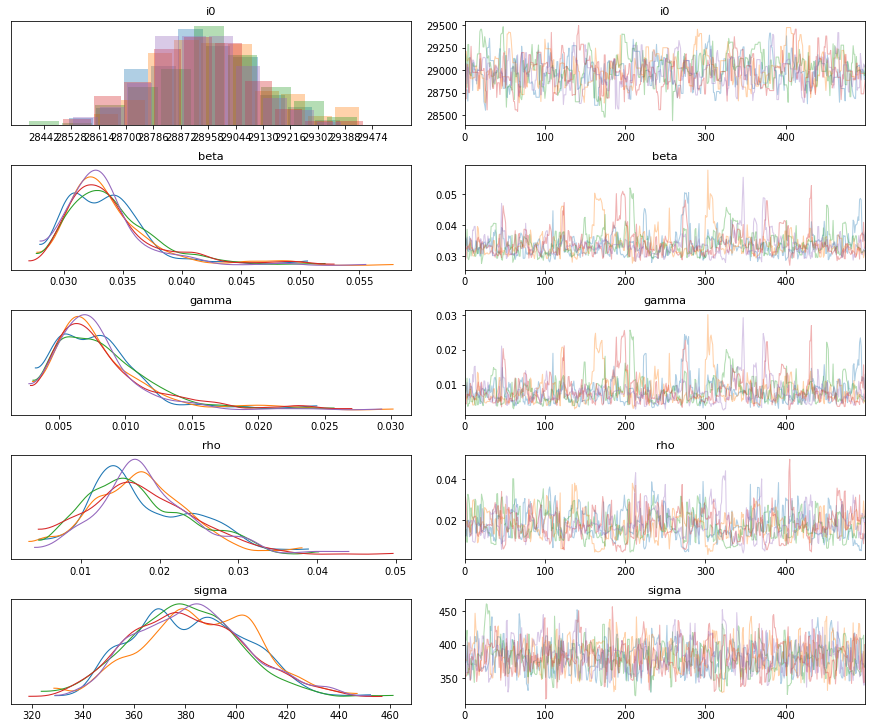

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,28992.01480,167.92067,28686.00000,29312.00000,8.30293,409.02113,1.01495,TX
1,beta,0.03393,0.00386,0.02870,0.04110,0.00021,327.44825,1.01060,TX
2,gamma,0.00822,0.00372,0.00346,0.01514,0.00020,336.67830,1.00950,TX
3,rho,0.01782,0.00668,0.00601,0.03036,0.00032,440.13610,1.00986,TX
4,sigma,382.53755,22.71711,342.93681,425.95273,0.76203,888.71156,1.00312,TX


'TX succeeded'

'======================================================================================================='

'UT:'

'======================================================================================================='

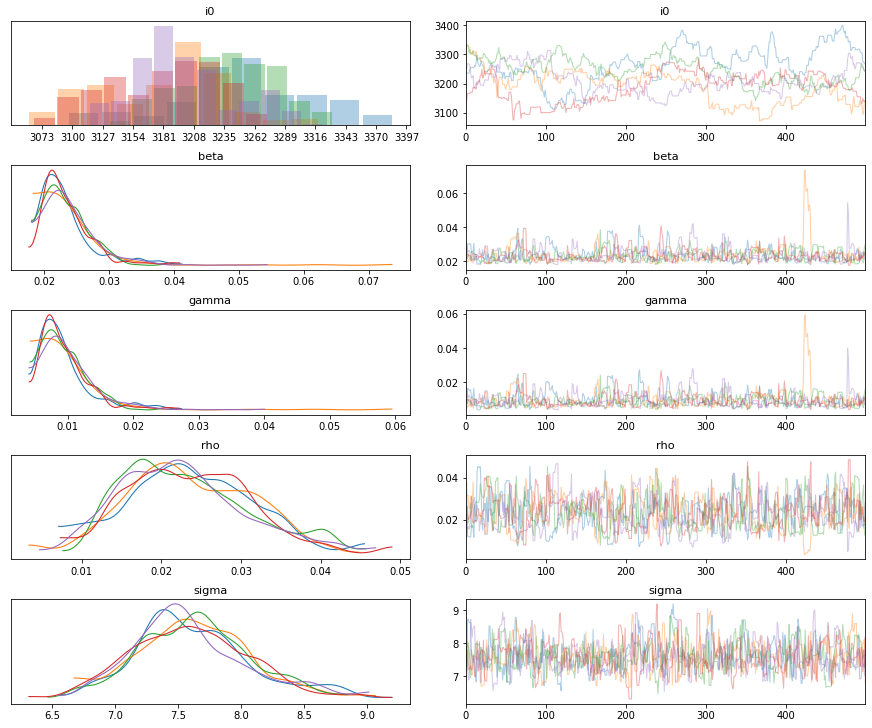

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,3219.87320,59.41626,3112.00000,3331.00000,19.48570,9.29777,1.52344,UT
1,beta,0.02359,0.00435,0.01823,0.03031,0.00022,377.49765,1.00827,UT
2,gamma,0.00958,0.00433,0.00441,0.01654,0.00022,376.97934,1.00830,UT
3,rho,0.02328,0.00785,0.00871,0.03734,0.00037,456.34856,1.00465,UT
4,sigma,7.61424,0.45716,6.77879,8.52958,0.01893,583.40231,1.00438,UT


'UT succeeded'

'======================================================================================================='

'VA:'

'======================================================================================================='

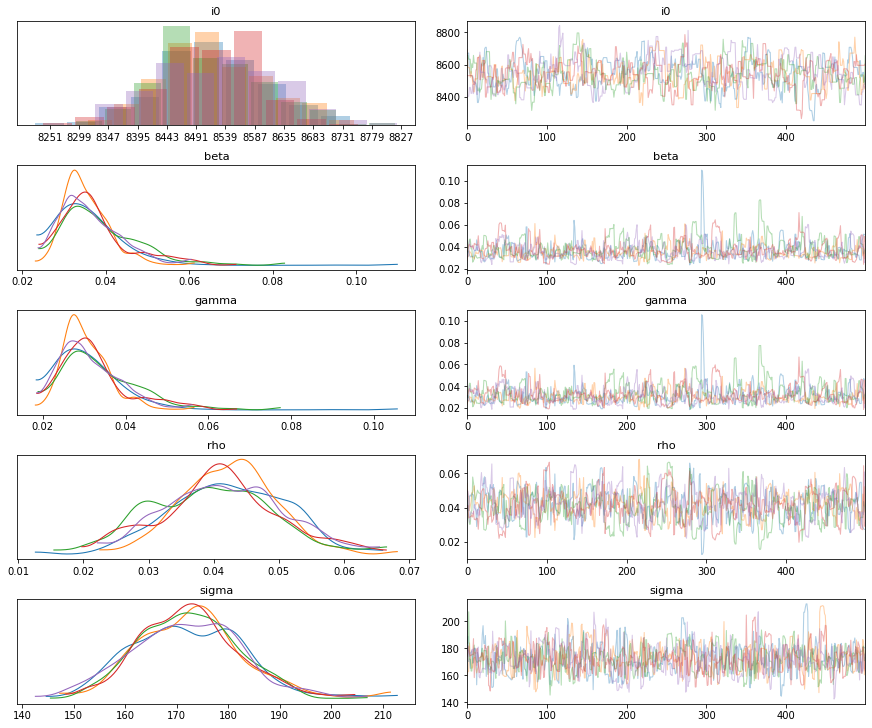

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,8543.14520,88.69893,8380.00000,8709.00000,5.14609,297.08623,1.00806,VA
1,beta,0.03668,0.00801,0.02544,0.05200,0.00038,447.37792,1.01727,VA
2,gamma,0.03182,0.00808,0.01996,0.04693,0.00038,447.79113,1.01827,VA
3,rho,0.04133,0.00879,0.02415,0.05718,0.00039,499.23624,1.01062,VA
4,sigma,172.37594,10.31336,153.09816,190.84986,0.38760,707.99572,1.00655,VA


'VA succeeded'

'======================================================================================================='

'VT:'

'======================================================================================================='

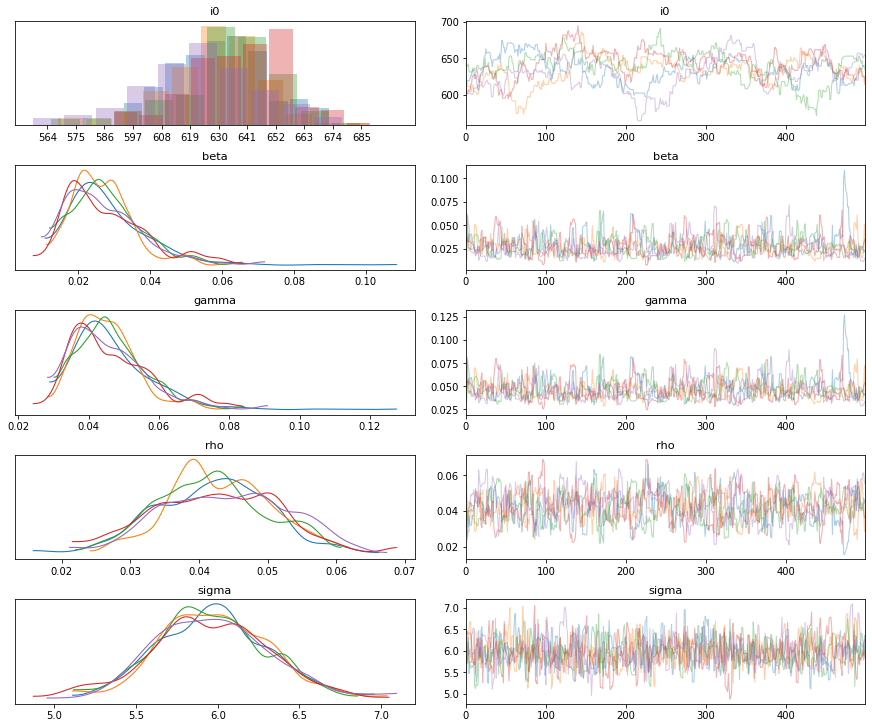

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,635.34640,20.36022,595.00000,670.00000,2.83829,51.45791,1.08218,VT
1,beta,0.02768,0.01060,0.00977,0.04646,0.00051,429.29194,1.01161,VT
2,gamma,0.04624,0.01074,0.02858,0.06526,0.00052,428.94798,1.01214,VT
3,rho,0.04259,0.00851,0.02810,0.05959,0.00041,438.55933,1.01053,VT
4,sigma,5.96342,0.34176,5.32519,6.61012,0.01181,836.98631,1.00192,VT


'VT succeeded'

'======================================================================================================='

'WA:'

'======================================================================================================='

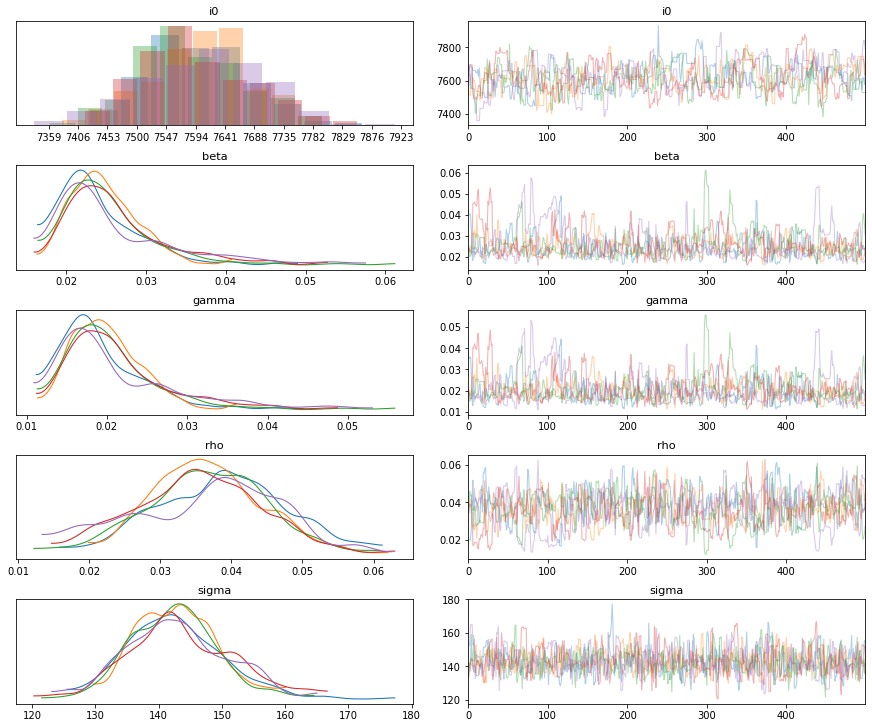

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,7619.96560,86.07736,7453.00000,7773.00000,5.98357,206.94612,1.02548,WA
1,beta,0.02538,0.00629,0.01668,0.03721,0.00040,241.58427,1.02001,WA
2,gamma,0.02055,0.00630,0.01180,0.03214,0.00040,244.17569,1.01947,WA
3,rho,0.03664,0.00902,0.01931,0.05304,0.00049,334.08191,1.01949,WA
4,sigma,142.83786,7.42821,130.23693,157.50761,0.24699,904.51430,1.00702,WA


'WA succeeded'

'======================================================================================================='

'WI:'

'======================================================================================================='

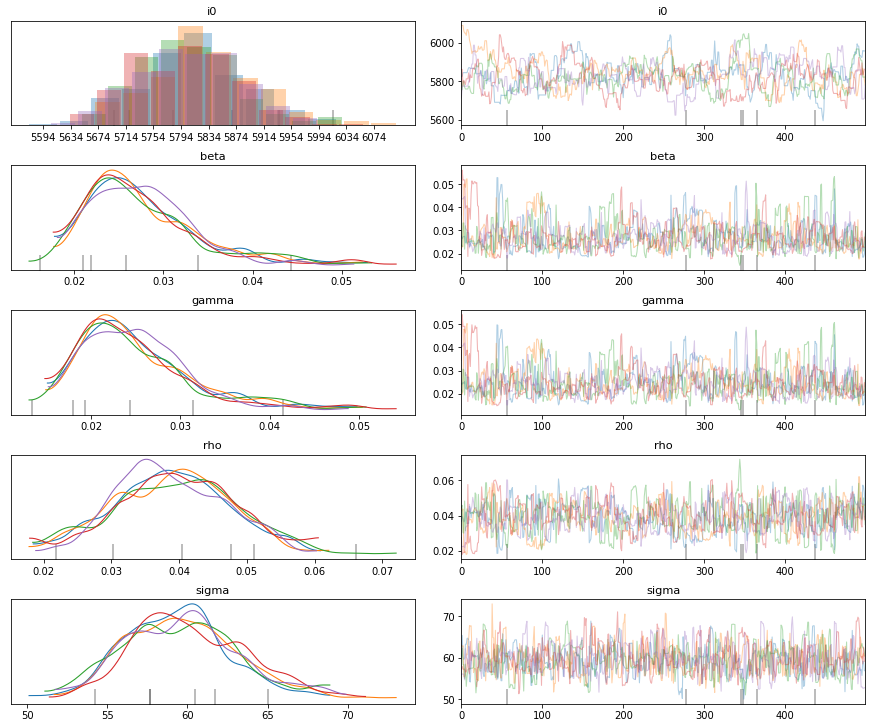

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,5829.96160,74.45406,5690.00000,5961.00000,6.16074,146.05334,1.02065,WI
1,beta,0.02756,0.00625,0.01816,0.03969,0.00034,338.20104,1.00269,WI
2,gamma,0.02492,0.00628,0.01520,0.03695,0.00034,339.12013,1.00262,WI
3,rho,0.03907,0.00858,0.02228,0.05460,0.00043,405.01117,1.00378,WI
4,sigma,59.66879,3.49128,53.61936,66.81492,0.12829,740.63176,1.00579,WI


'WI succeeded'

'======================================================================================================='

'WV:'

'======================================================================================================='

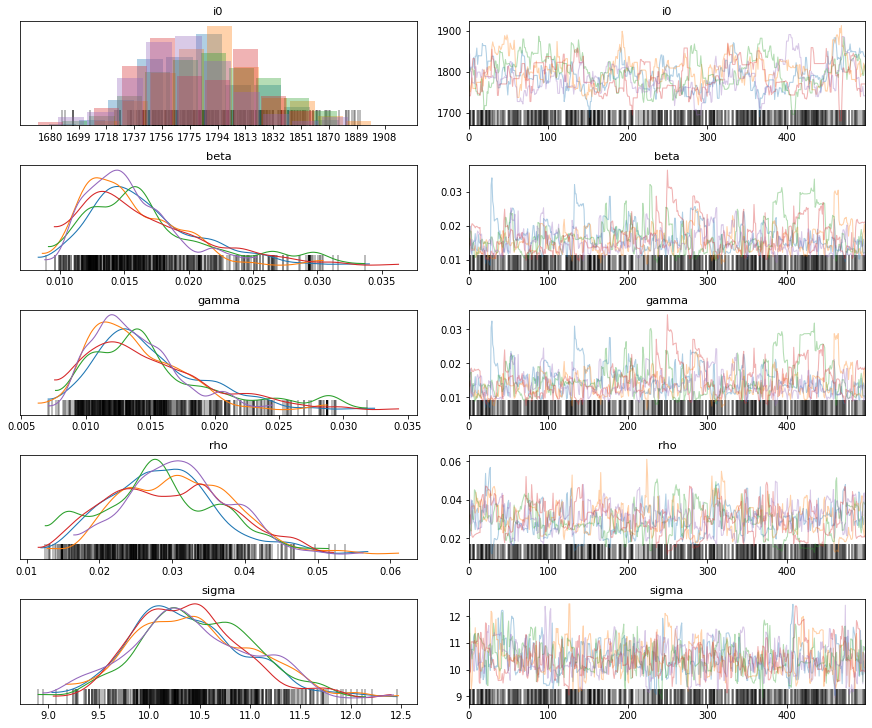

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,1792.60320,36.37206,1733.00000,1864.00000,3.18776,130.18599,1.02512,WV
1,beta,0.01612,0.00431,0.00988,0.02483,0.00037,134.25991,1.02702,WV
2,gamma,0.01451,0.00431,0.00765,0.02277,0.00037,134.57158,1.02867,WV
3,rho,0.02975,0.00779,0.01482,0.04309,0.00052,221.56115,1.02176,WV
4,sigma,10.43260,0.58777,9.36703,11.53948,0.02617,504.55911,1.00531,WV


'WV succeeded'

'======================================================================================================='

'WY:'

'======================================================================================================='

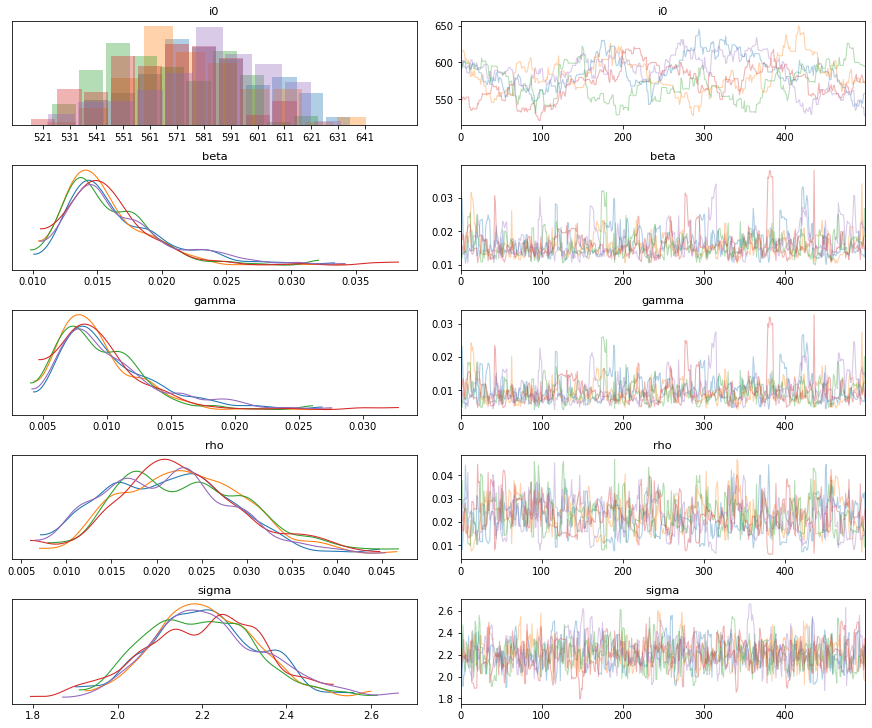

'summary:'

'======================================================================================================='

,param,mean,sd,hdi_3%,hdi_97%,mcse_mean,ess_mean,r_hat,state
0,i0,580.57480,23.22814,537.00000,620.00000,3.61621,41.25938,1.07735,WY
1,beta,0.01618,0.00385,0.01045,0.02298,0.00020,380.24491,1.01612,WY
2,gamma,0.00984,0.00381,0.00457,0.01650,0.00020,377.41439,1.01592,WY
3,rho,0.02237,0.00723,0.00975,0.03652,0.00039,349.06592,1.02156,WY
4,sigma,2.20770,0.13242,1.96664,2.46219,0.00530,624.57429,1.00367,WY


'WY succeeded'

'======================================================================================================='

In [4]:
summary = pd.DataFrame()
trace_table = 0
none = None

for state in stateData['state'].unique():
#for state in ["AL","CA","FL","KS","MD","NM","RI","TX"]:
    QueryScope.addParam("state",state)
    
    display(state + ":")
    display("=======================================================================================================")
                        
    try:
        # perform sampling, first set of starting values
        this_sample = sampleMCMC(stateData.loc[stateData.state == state], statePops[state], 1)
        
    except Exception as e:
        
        try:
            # perform sampling, second set of starting values
            this_sample = sampleMCMC(stateData.loc[stateData.state == state], statePops[state], 2)
            
        except Exception as e:
            
            try:
                # perform sampling, last set of starting values
                this_sample = sampleMCMC(stateData.loc[stateData.state == state], statePops[state], 3)
                
            except Exception as e:
    
                if trace_table == 0:
                    trace_table = ttools.emptyTable(1).update("state=state","trace=none")
                    #db.appendTable("peters_namespace","covid_mcmc_results",trace_table)
                else:
                    this_table = ttools.emptyTable(1).update("state=state","trace=none")
                    trace_table = ttools.merge(trace_table, this_table)
                    #db.appendTable("peters_namespace","covid_mcmc_results",this_table)
                display(state + ' failed')
                display("=======================================================================================================")
                continue
                
    # create summary table
    these_results = (pm.summary(this_sample, var_names=['i0','beta','gamma','rho','sigma'], round_to=5).
        drop(['mcse_sd','ess_sd','ess_bulk','ess_tail'], axis=1).
        reset_index().rename(columns={"index": "param"}))
    these_results['state'] = state

    # make plots
    plot = pm.plot_trace(this_sample, var_names=('i0','beta','gamma','rho','sigma'))
    pplt.show()

    if sum(these_results[1:4]['r_hat']) > 3.15:
        if trace_table == 0:
            trace_table = ttools.emptyTable(1).update("state=state","trace=none")
            #db.appendTable("peters_namespace","covid_mcmc_results",trace_table)
        else:
            this_table = ttools.emptyTable(1).update("state=state","trace=none")
            trace_table = ttools.merge(trace_table, this_table)
            #db.appendTable("peters_namespace","covid_mcmc_results",this_table)
        display(state + ' failed')
        display("=======================================================================================================")
            
    else:
        summary = summary.append(these_results)

        # update trace table
        if trace_table == 0:
            trace_table = ttools.emptyTable(1).update("state=state","trace=this_sample")
            print(tableToDataFrame(trace_table))
            #db.appendTable("peters_namespace","covid_mcmc_results",trace_table)
        else:
            this_table = ttools.emptyTable(1).update("state=state","trace=this_sample")
            trace_table = ttools.merge(trace_table, this_table)
            #db.appendTable("peters_namespace","covid_mcmc_results",this_table)

        display('summary:')
        display("=======================================================================================================")

        display(these_results)

        display(state + ' succeeded')
        display("=======================================================================================================")
    
    #tableToDataFrame(db.t("peters_namespace","covid_mcmc_results"))

# Plotting

In [ ]:
# plotting beta per state
fig_beta = go.Figure(data=go.Choropleth(
    locations = summary[summary['param']=='beta']['state'], # Spatial coordinates
    z = summary[summary['param']=='beta']['mean'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'YlOrBr',
    colorbar_title = "Transmission Rate per Day",
))

fig_beta.update_layout(
    title_text = 'MCMC Estimates of COVID-19 Transmission Rate by State',
    geo_scope='usa', # limite map scope to USA
)

fig_beta.show()

In [ ]:
# plotting gamma per state
fig_gamma = go.Figure(data=go.Choropleth(
    locations = summary[summary['param']=='gamma']['state'], # Spatial coordinates
    z = summary[summary['param']=='gamma']['mean'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Greens',
    colorbar_title = "Removal Rate per Day",
))

fig_gamma.update_layout(
    title_text = 'MCMC Estimates of COVID-19 Removal Rate by State',
    geo_scope='usa', # limite map scope to USA
)

fig_gamma.show()

In [ ]:
# plotting r0 per state
fig_r0 = go.Figure(data=go.Choropleth(
    locations = summary[summary['param']=='beta']['state'], # Spatial coordinates
    z = summary[summary['param']=='beta']['mean'].astype(float).to_numpy() / summary[summary['param']=='gamma']['mean'].astype(float).to_numpy(), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'balance',
    zmid=1,
    colorbar_title = "Estimated R0",
))

fig_r0.update_layout(
    title_text = 'MCMC Estimates of COVID-19 R0 by State',
    geo_scope='usa', # limite map scope to USA
)

fig_r0.show()

In [ ]:
# plotting rho per state
fig_rho = go.Figure(data=go.Choropleth(
    locations = summary[summary['param']=='rho']['state'], # Spatial coordinates
    z = summary[summary['param']=='rho']['mean'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "Mortality Rate per Infection",
))

fig_rho.update_layout(
    title_text = 'MCMC Estimates of COVID-19 Mortality Rate by State',
    geo_scope='usa', # limite map scope to USA
)

fig_rho.show()

In [ ]:
# plotting ovrsk per state
fig_ovrsk = go.Figure(data=go.Choropleth(
    locations = summary[summary['param']=='beta']['state'], # Spatial coordinates
    z = summary[summary['param']=='rho']['mean'].astype(float).to_numpy() * 
        (summary[summary['param']=='beta']['mean'].astype(float).to_numpy() / 
         summary[summary['param']=='gamma']['mean'].astype(float).to_numpy()), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Burgyl',
    colorbar_title = "Overall Risk",
))

fig_ovrsk.update_layout(
    title_text = 'Estimated Overall Risk of COVID-19 by State',
    geo_scope='usa', # limite map scope to USA
)

fig_ovrsk.show()